# Hitter

In [140]:
df_hitter_perf = pd.read_csv('./data/hitter_perf.csv', index_col=0)
df_hitter_etc = pd.read_csv('./data/hitter_etc.csv', index_col=0)

In [141]:
df_hitter_perf.columns,df_hitter_etc.columns

(Index([u'이름', u'연도', u'연봉(=Y)', u'총액(억)', u'계약년수(년)', u'년도', u'AVG_A', u'OBP_A', u'SLG_A', u'WAR_A', u'HR%_A', u'BB%_A', u'K%_A', u'BIPA_A', u'Spd_A', u'PSN_A', u'wOBA_A', u'wRC_A', u'wRAA_A', u'AVG_B', u'OBP_B', u'SLG_B', u'WAR_B', u'HR%_B', u'BB%_B', u'K%_B', u'BIPA_B', u'Spd_B', u'PSN_B', u'wOBA_B', u'wRC_B', u'wRAA_B'], dtype='object'),
 Index([u'Name', u'Year', u'Spectators', u'TitleSponsors', u'Broadcasting', u'GDP', u'Clubs', u'FA_Pitcher', u'FA_Hitter', u'BirthYear', u'Age', u'Captain', u'NationalMember', u'Marriage', u'Surgery', u'Salary', u'Total', u'Period', u'Transfer', u'GoldenGlove', u'Rookie', u'AllStar', u'Interest', u'Inflation', u'Hometown', u'RewardPlayer', u'PreviousTeam', u'NewTeam', u'Position'], dtype='object'))

In [142]:
dfX_hitter_perf = df_hitter_perf[['AVG_A', 'OBP_A', 'SLG_A', 'WAR_A', 'HR%_A', 'BB%_A', 'K%_A', 'BIPA_A', 'Spd_A', 'PSN_A', 'wOBA_A', 'wRC_A', 'wRAA_A', 'AVG_B', 'OBP_B', 'SLG_B', 'WAR_B', 'HR%_B', 'BB%_B', 'K%_B', 'BIPA_B', 'Spd_B', 'PSN_B', 'wOBA_B', 'wRC_B', 'wRAA_B']]
dfX_hitter_perf.columns=['AVG_A', 'OBP_A', 'SLG_A', 'WAR_A', 'HR_A', 'BB_A', 'K_A', 'BIPA_A', 'Spd_A', 'PSN_A', 'wOBA_A', 'wRC_A', 'wRAA_A', 'AVG_B', 'OBP_B', 'SLG_B', 'WAR_B', 'HR_B', 'BB_B', 'K_B', 'BIPA_B', 'Spd_B', 'PSN_B', 'wOBA_B', 'wRC_B', 'wRAA_B']
dfX_hitter_etc = df_hitter_etc[['Spectators','Broadcasting', 'GDP','Clubs','FA_Pitcher','FA_Hitter', 'Age', 'Captain', 'NationalMember', 'Marriage', 'Surgery', 'Transfer', 'GoldenGlove', 'Rookie', 'AllStar']]
dfy_hitter = df_hitter_etc['Salary']

In [143]:
idx = dfy_hitter == '-'
df_hitter = pd.concat([dfX_hitter_perf, dfX_hitter_etc, dfy_hitter], axis=1)
df_hitter['Salary'][idx] = 0
df_hitter = sm.add_constant(df_hitter).astype(float)

/home/dockeruser/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [144]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [145]:
df_hitter.describe()

,const,AVG_A,OBP_A,SLG_A,WAR_A,HR_A,BB_A,K_A,BIPA_A,Spd_A,PSN_A,wOBA_A,wRC_A,wRAA_A,AVG_B,OBP_B,SLG_B,WAR_B,HR_B,BB_B,K_B,BIPA_B,Spd_B,PSN_B,wOBA_B,wRC_B,wRAA_B,Spectators,Broadcasting,GDP,Clubs,FA_Pitcher,FA_Hitter,Age,Captain,NationalMember,Marriage,Surgery,Transfer,GoldenGlove,Rookie,AllStar,Salary
count,125.0,125.000000,125.000000,125.000000,125.000000,125.00000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000,1.250000e+02,125.000000,1.250000e+02,125.000000,125.000000,125.000000,125.00000,125.000000,125.000000,125.0000,125.000000,125.000000,125.000000,125.000000,125.000000,125.000000
mean,1.0,0.307088,0.389368,0.484120,4.937040,3.10552,10.629600,13.980000,0.333856,4.528800,10.243680,0.388960,83.110400,23.602400,0.279256,0.363096,0.422840,2.344800,2.463760,10.411200,15.175200,0.311360,3.608000,4.713200,0.355152,54.498400,7.214400,5.276634e+06,251.973440,1.191661e+06,8.512000,4.312000,8.704000,34.44800,0.376000,0.680000,0.7760,0.456000,0.280000,1.568000,0.104000,4.168000,6.791680
std,0.0,0.028798,0.037477,0.086538,2.104512,1.92635,3.279458,4.174036,0.027876,1.672685,7.815597,0.044918,27.793419,20.229364,0.039206,0.043117,0.092773,1.761019,1.818149,3.222081,4.959134,0.040938,1.557894,4.411567,0.050292,30.433007,16.878029,1.980147e+06,177.629111,3.025869e+05,0.768492,2.733944,3.136733,2.56671,0.486329,0.468353,0.4186,0.500065,0.450806,1.964754,0.306489,3.063142,5.060301
min,1.0,0.236000,0.298000,0.321000,0.280000,0.00000,3.300000,5.500000,0.260000,1.300000,0.000000,0.282000,9.300000,-14.600000,0.157000,0.261000,0.196000,-0.540000,0.000000,2.400000,7.500000,0.200000,0.100000,0.000000,0.246000,0.400000,-32.100000,2.331978e+06,46.000000,5.768730e+05,8.000000,0.000000,1.000000,28.00000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.0,0.289000,0.366000,0.419000,3.420000,1.59000,8.300000,11.000000,0.320000,3.100000,3.780000,0.359000,66.800000,8.200000,0.256000,0.335000,0.367000,1.000000,1.030000,8.000000,11.400000,0.288000,2.700000,1.670000,0.322000,33.600000,-3.300000,3.387843e+06,90.000000,9.197970e+05,8.000000,2.000000,7.000000,33.00000,0.000000,0.000000,1.0000,0.000000,0.000000,0.000000,0.000000,1.000000,2.750000
50%,1.0,0.308000,0.384000,0.475000,5.150000,2.98000,10.300000,13.500000,0.333000,4.400000,8.730000,0.388000,82.300000,21.500000,0.284000,0.366000,0.418000,2.090000,2.250000,10.000000,14.200000,0.309000,3.500000,3.640000,0.355000,55.000000,4.500000,5.928626e+06,212.000000,1.265308e+06,8.000000,3.000000,9.000000,34.00000,0.000000,1.000000,1.0000,0.000000,0.000000,1.000000,0.000000,4.000000,6.000000
75%,1.0,0.324000,0.409000,0.536000,5.970000,4.25000,12.500000,16.300000,0.353000,5.700000,14.440000,0.416000,99.100000,35.500000,0.307000,0.389000,0.480000,3.370000,3.570000,12.400000,17.900000,0.339000,4.500000,6.860000,0.389000,74.900000,15.500000,6.810028e+06,302.000000,1.429445e+06,9.000000,7.000000,12.000000,36.00000,1.000000,1.000000,1.0000,1.000000,1.000000,3.000000,0.000000,7.000000,8.750000
max,1.0,0.393000,0.478000,0.720000,11.770000,8.82000,20.600000,28.100000,0.402000,8.300000,32.730000,0.498000,154.700000,80.700000,0.376000,0.464000,0.789000,8.390000,9.400000,18.700000,28.700000,0.442000,7.800000,21.330000,0.480000,154.700000,68.100000,8.339577e+06,560.000000,1.623840e+06,10.000000,9.000000,12.000000,42.00000,1.000000,1.000000,1.0000,1.000000,1.000000,9.000000,1.000000,12.000000,25.000000


In [157]:
sm.stats.stattools.omni_normtest(df_hitter1['AVG_A'])

NormaltestResult(statistic=1.2846424659430031, pvalue=0.52606987494231472)

- wRAA_A, WAR_B, wRAA_B -> 음수값 존재

# 1. OLS

In [146]:
from sklearn.linear_model import LinearRegression
model_sklearn = LinearRegression().fit(df_hitter.ix[:,:-1], df_hitter.ix[:,-1])
model_sm = sm.OLS(df_hitter.ix[:,-1], df_hitter.ix[:,:-1])
result_sm = model_sm.fit()

In [147]:
print(result_sm.summary())

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     7.913
Date:                Wed, 08 Mar 2017   Prob (F-statistic):           1.22e-15
Time:                        06:17:34   Log-Likelihood:                -280.11
No. Observations:                 125   AIC:                             644.2
Df Residuals:                      83   BIC:                             763.0
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              5.3964     26.179      0.

In [148]:
model_sm2 = sm.OLS.from_formula("Salary ~ AVG_A + OBP_A + SLG_A + WAR_A + HR_A + BB_A + K_A + BIPA_A + Spd_A + PSN_A + wOBA_A + wRC_A + wRAA_A + AVG_B + OBP_B + SLG_B + WAR_B + HR_B + BB_B + K_B + BIPA_B + Spd_B + PSN_B + wOBA_B + wRC_B + wRAA_B + Spectators + Broadcasting + GDP + Clubs + FA_Pitcher + FA_Hitter + Age + Captain + NationalMember + Marriage + Surgery + Transfer + GoldenGlove + Rookie + AllStar", data=df_hitter)
result_sm2 = model_sm2.fit()
table = sm.stats.anova_lm(result_sm2)
table

,df,sum_sq,mean_sq,F,PR(>F)
AVG_A,1.0,485.521478,485.521478,62.297234,1.062877e-11
OBP_A,1.0,109.296818,109.296818,14.023869,3.319605e-04
SLG_A,1.0,30.890911,30.890911,3.963611,4.978406e-02
WAR_A,1.0,108.543137,108.543137,13.927164,3.468842e-04
HR_A,1.0,3.129998,3.129998,0.401610,5.280016e-01
BB_A,1.0,51.240387,51.240387,6.574651,1.214568e-02
K_A,1.0,12.648383,12.648383,1.622913,2.062418e-01
BIPA_A,1.0,9.797151,9.797151,1.257072,2.654395e-01
Spd_A,1.0,57.362121,57.362121,7.360131,8.106301e-03
PSN_A,1.0,107.224300,107.224300,13.757944,3.746852e-04


# 2. Pairplot

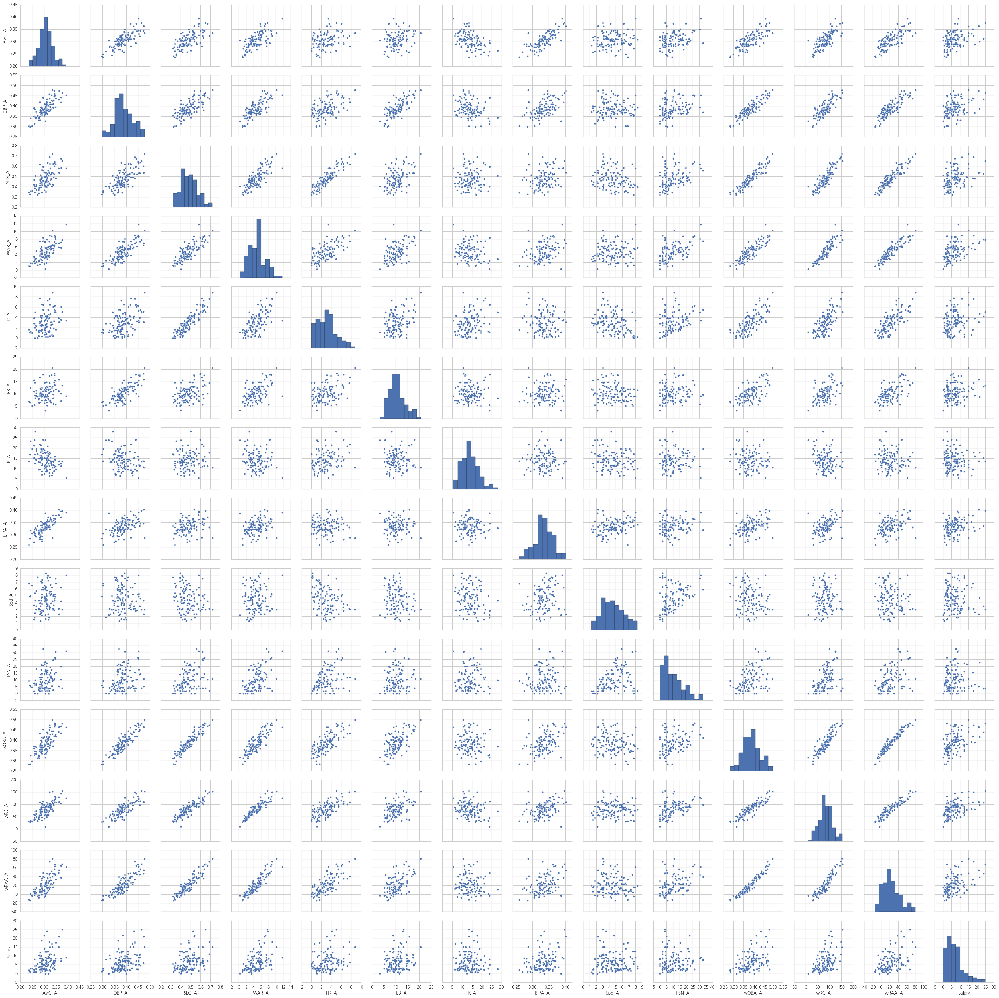

In [149]:
dff = pd.concat([df_hitter.ix[:,1:14], df_hitter.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

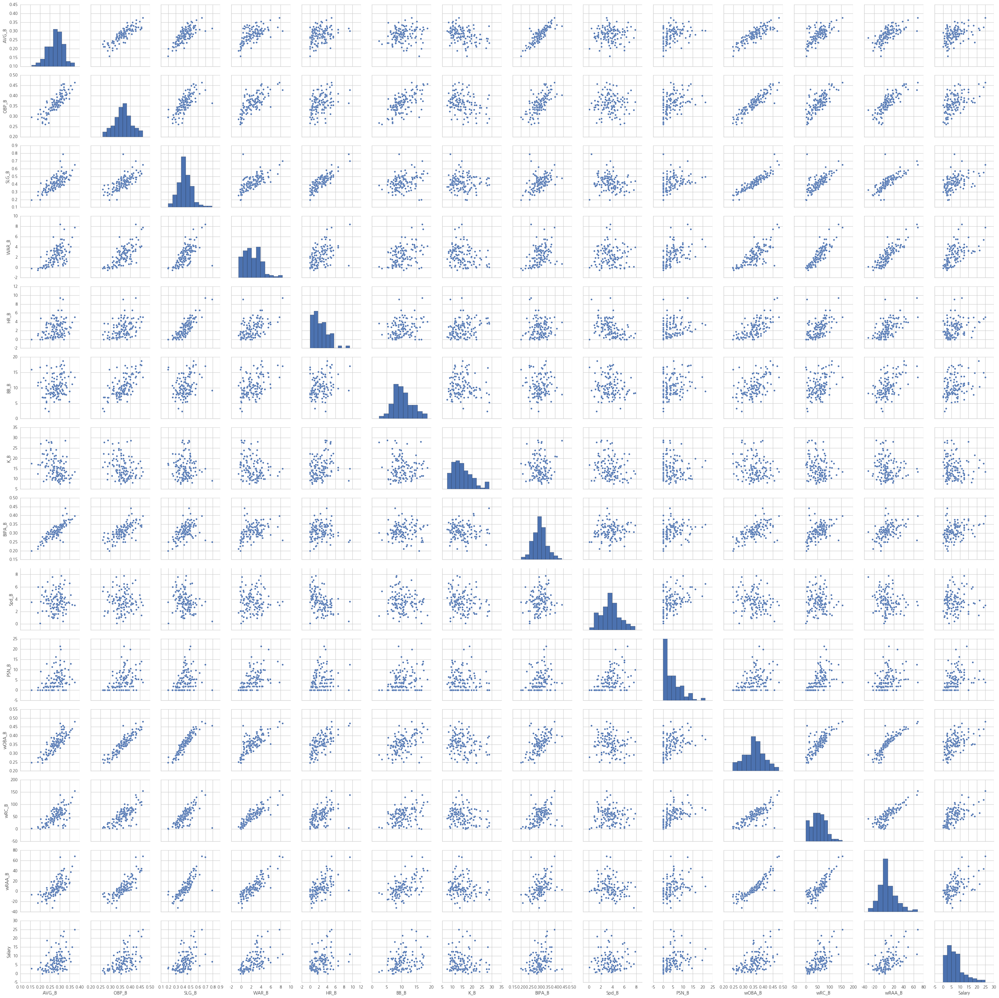

In [150]:
dff = pd.concat([df_hitter.ix[:,14:27], df_hitter.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

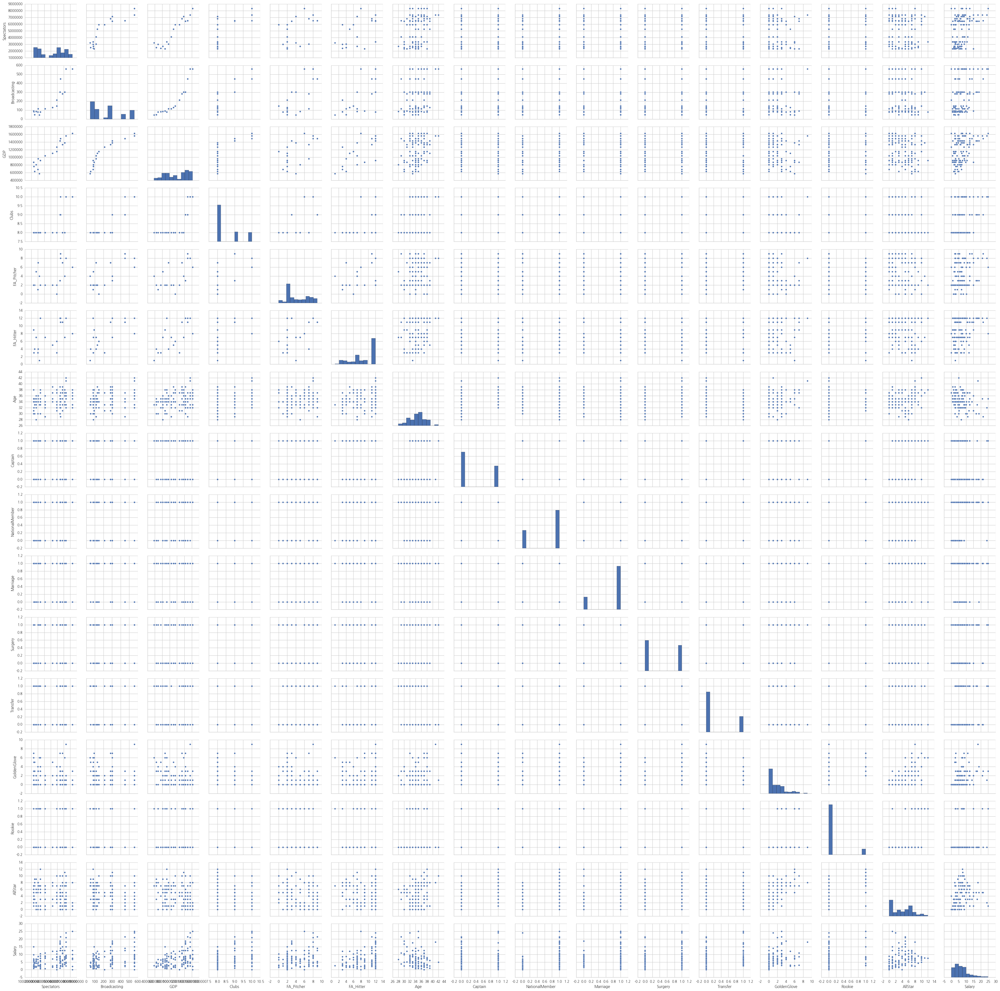

In [152]:
dff = pd.concat([df_hitter.ix[:,27:-1], df_hitter.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

### 히스토그램 관찰 결과
SLG_A, WAR_A, HR%_A, BB%_A, K%_A, Spd_A, PSN_A, wRAA_A, SLG_B, WAR_B, HR%_B, K%_B, PSN_B, WRC_B, wRAA_B, Spectators, Broadcasting, GDP, GoldenGlove, Allstar 
이 변수들을 로그 변환 해주기로 함

# 3.  로그변환 

In [153]:
#로그변환
df_hitter1 = df_hitter.copy()

df_hitter1["LogSLG_A"]= np.log(df_hitter1["SLG_A"]+0.0001)
df_hitter1["LogWAR_A"]= np.log(df_hitter1["WAR_A"]+0.0001)
df_hitter1["LogHR_A"]= np.log(df_hitter1["HR_A"]+1.0001)
df_hitter1["LogBB_A"]= np.log(df_hitter1["BB_A"]+0.0001)
df_hitter1["LogK_A"]= np.log(df_hitter1["K_A"]+0.0001)
df_hitter1["LogSpd_A"]= np.log(df_hitter1["Spd_A"]+0.0001)
df_hitter1["LogPSN_A"]= np.log(df_hitter1["PSN_A"]+1.0001)
df_hitter1["LogwRAA_A"]= np.log(df_hitter1["wRAA_A"]+15.6001)   #  마이너스

df_hitter1["LogSLG_B"]= np.log(df_hitter1["SLG_B"]+0.0001)
df_hitter1["LogWAR_B"]= np.log(df_hitter1["WAR_B"]+0.64001)   # 마이너스 
df_hitter1["LogPSN_B"]= np.log(df_hitter1["PSN_B"]+0.0001)
df_hitter1["LogHR_B"]= np.log(df_hitter1["HR_B"]+ 1.0001)
df_hitter1["LogK_B"]= np.log(df_hitter1["K_B"]+0.0001)
df_hitter1["LogwRC_B"]= np.log(df_hitter1["wRC_B"]+0.0001)
df_hitter1["LogwRAA_B"]= np.log(df_hitter1["wRAA_B"]+33.1001)   # 마이

df_hitter1["LogSpectators"]= np.log(df_hitter1["Spectators"]+0.0001)
df_hitter1["LogBroadcasting"]= np.log(df_hitter1["Broadcasting"]+0.0001)
df_hitter1["LogGDP"]= np.log(df_hitter1["GDP"]+0.0001)
df_hitter1["LogGoldenGlove"]= np.log(df_hitter1["GoldenGlove"]+1.0001)
df_hitter1["LogAllStar"]= np.log(df_hitter1["AllStar"]+1.0001)
df_hitter1["LogSalary"]= np.log(df_hitter1["Salary"]+ 1.0001)

del df_hitter1["SLG_A"]
del df_hitter1["WAR_A"]
del df_hitter1["HR_A"]
del df_hitter1["BB_A"]
del df_hitter1["K_A"]
del df_hitter1["Spd_A"]
del df_hitter1["PSN_A"]
del df_hitter1["wRAA_A"]

del df_hitter1["SLG_B"]
del df_hitter1["WAR_B"]
del df_hitter1["HR_B"]
del df_hitter1["PSN_B"]
del df_hitter1["K_B"]
del df_hitter1["wRC_B"]
del df_hitter1["wRAA_B"]

del df_hitter1["Spectators"]
del df_hitter1["Broadcasting"]
del df_hitter1["GDP"]
del df_hitter1["GoldenGlove"]
del df_hitter1["AllStar"]

del df_hitter1["Salary"]
#idx = dfy_hitter. == '-'
#df_hitter1 = pd.concat([df_hitter1, dfy_hitter], axis=1)
#df_hitter1 = df_hitter1.drop(df_hitter1.index[idx]).astype(float)

In [129]:
df_hitter1.tail()

,const,AVG_A,OBP_A,WAR_A,BIPA_A,wOBA_A,wRC_A,AVG_B,OBP_B,BB_B,BIPA_B,Spd_B,wOBA_B,Clubs,FA_Pitcher,FA_Hitter,Age,Captain,NationalMember,Marriage,Surgery,Transfer,Rookie,LogSLG_A,LogHR_A,LogBB_A,LogK_A,LogSpd_A,LogPSN_A,LogwRAA_A,LogSLG_B,LogWAR_B,LogPSN_B,LogHR_B,LogK_B,LogwRC_B,LogwRAA_B,LogSpectators,LogBroadcasting,LogGDP,LogGoldenGlove,LogAllStar,LogSalary
121,1.0,0.287,0.394,4.23,0.338,0.400,86.7,0.308,0.451,17.5,0.342,4.1,0.450,10.0,6.0,8.0,33.0,0.0,1.0,0.0,1.0,0.0,0.0,-0.746295,1.613454,2.476548,3.058713,0.916339,2.442357,3.691379,-0.560156,1.521702,2.270074,1.814844,2.917777,4.684906,4.294562,15.936523,6.327937,14.300304,0.000120,1.098652,2.397906
122,1.0,0.282,0.350,1.45,0.316,0.354,54.8,0.335,0.408,10.1,0.410,3.4,0.404,10.0,6.0,8.0,36.0,0.0,1.0,1.0,0.0,0.0,0.0,-0.884017,0.879677,2.219217,2.580226,1.361007,1.757879,2.975536,-0.698924,0.598843,1.321788,1.229676,3.034959,3.624344,3.728103,15.936523,6.327937,14.300304,0.000120,0.000120,1.178692
123,1.0,0.310,0.411,5.50,0.341,0.416,78.0,0.322,0.380,7.9,0.365,4.1,0.369,10.0,6.0,8.0,38.0,0.0,1.0,1.0,1.0,0.0,0.0,-0.694909,1.319118,2.694635,2.653250,1.163188,1.757879,3.835145,-0.832133,0.698141,1.925725,0.892047,2.646183,4.128748,3.600052,15.936523,6.327937,14.300304,0.000120,2.197238,2.079457
124,1.0,0.328,0.408,5.33,0.362,0.404,98.8,0.332,0.403,10.6,0.351,2.3,0.400,10.0,6.0,8.0,38.0,1.0,1.0,1.0,1.0,0.0,0.0,-0.653696,1.393796,2.397906,2.602699,1.722788,2.609343,3.850150,-0.733719,0.832914,1.203008,1.211977,2.341817,4.316155,3.883626,15.936523,6.327937,14.300304,0.693207,2.197238,2.140080
125,1.0,0.305,0.326,0.28,0.387,0.316,9.3,0.212,0.272,6.9,0.244,2.1,0.262,10.0,6.0,8.0,37.0,0.0,1.0,1.0,0.0,0.0,0.0,-0.911005,0.737221,1.193959,3.173883,0.788512,0.000120,2.484917,-1.210259,-0.733944,-9.028019,1.000676,2.895919,1.791779,3.126766,15.936523,6.327937,14.300304,0.000120,0.000120,0.000120


In [154]:
model_sm1 = sm.OLS(df_hitter1.ix[:,-1], df_hitter1.ix[:,:-1])
result_sm1 = model_sm1.fit()
print(result_sm1.summary())

                            OLS Regression Results                            
Dep. Variable:              LogSalary   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.766
Method:                 Least Squares   F-statistic:                     10.91
Date:                Wed, 08 Mar 2017   Prob (F-statistic):           6.34e-20
Time:                        06:32:27   Log-Likelihood:                -8.7844
No. Observations:                 125   AIC:                             101.6
Df Residuals:                      83   BIC:                             220.4
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             -23.3683      9.513     

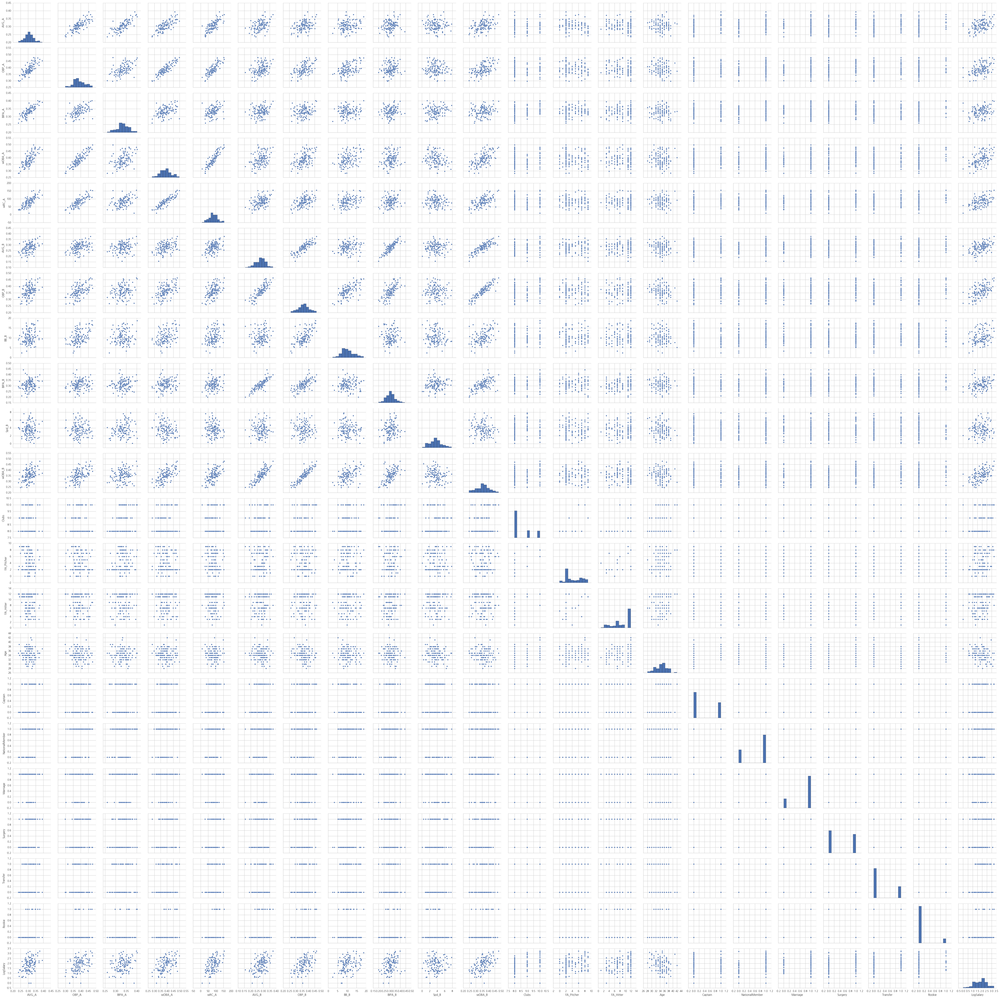

In [155]:
dff = pd.concat([df_hitter1.ix[:,1:22], df_hitter1.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

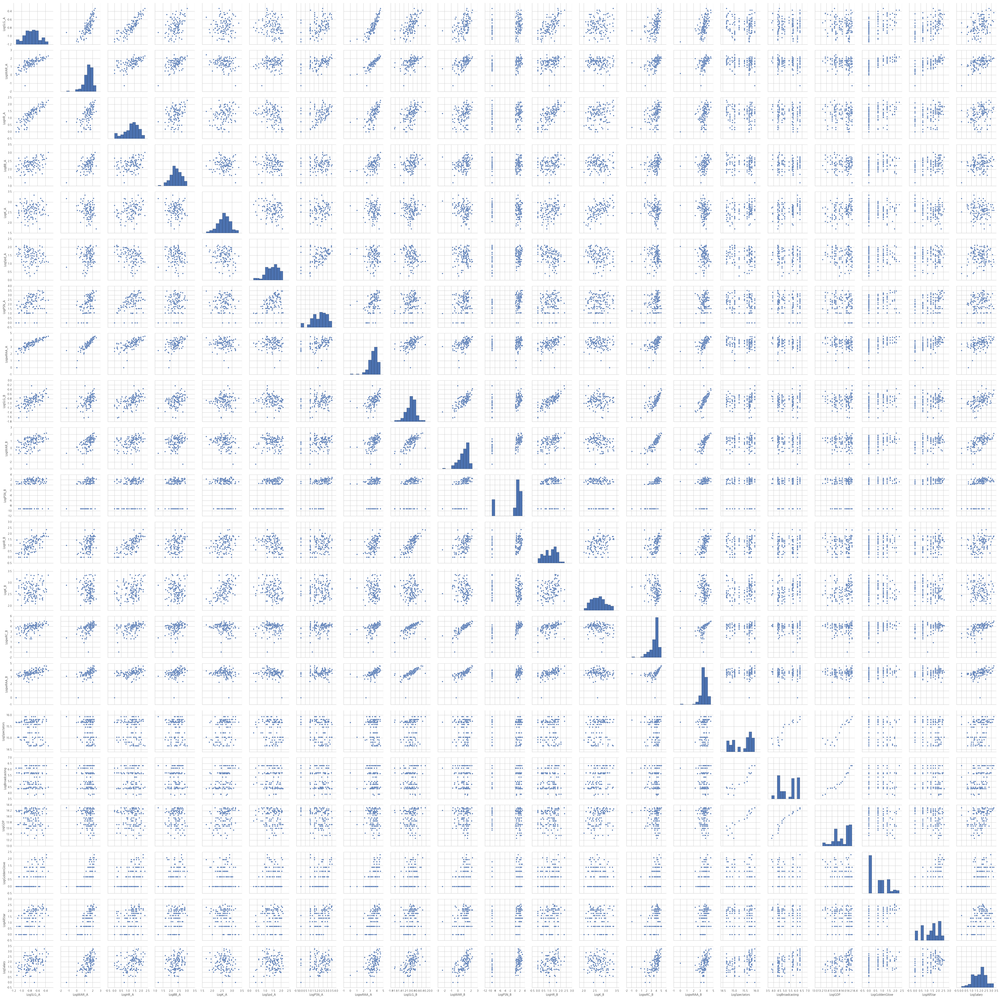

In [156]:
dff = pd.concat([df_hitter1.ix[:,22:-1], df_hitter1.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

In [138]:
sm.stats.stattools.omni_normtest(df_hitter1.ix[:,"LogPSN_A":]), sm.stats.stattools.omni_normtest(df_hitter1["LogPSN_A"])

(NormaltestResult(statistic=array([  10.41958211,   55.2995239 ,    9.09724595,   25.89150377,
         30.87862752,    5.99138766,    4.66611573,   68.74949383,
        104.54223105,  106.48770913,  196.08995729,   15.27232061,
         38.55040189,   14.19667152,    1.34814666]), pvalue=array([  5.46281499e-03,   9.81433683e-13,   1.05817657e-02,
         2.38633490e-06,   1.97147480e-07,   5.00019222e-02,
         9.69986844e-02,   1.17824905e-15,   1.99041193e-23,
         7.52467537e-24,   2.62788766e-43,   4.82678235e-04,
         4.25487291e-09,   8.26479238e-04,   5.09628459e-01])),
 NormaltestResult(statistic=10.419582110601239, pvalue=0.0054628149946384288))

In [139]:
sm.stats.stattools.omni_normtest(df_hitter1['LogPSN_A'])

NormaltestResult(statistic=10.419582110601239, pvalue=0.0054628149946384288)

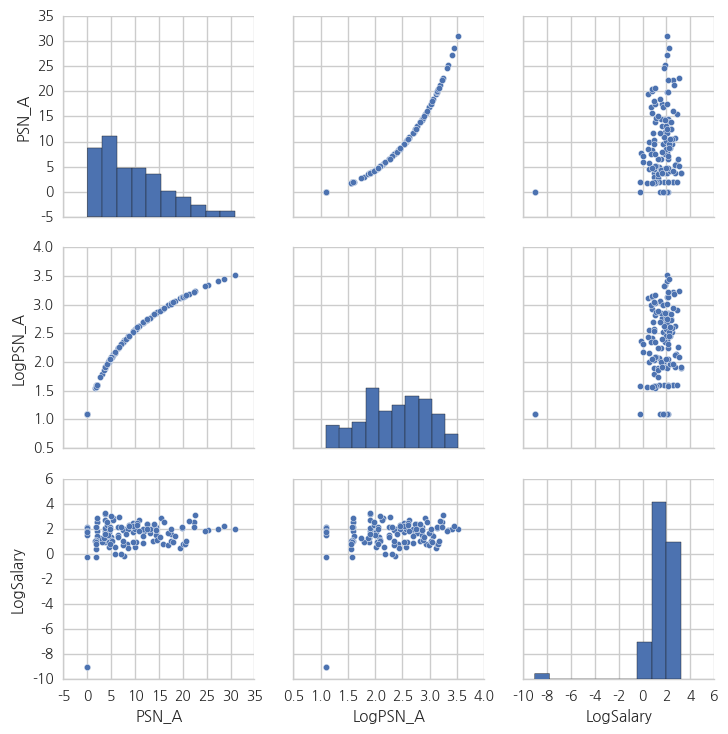

In [100]:
dff = pd.concat([df_hitter["PSN_A"], df_hitter1["LogPSN_A"], df_hitter1.ix[:,-1]],axis=1)
sns.pairplot(dff)
plt.show()

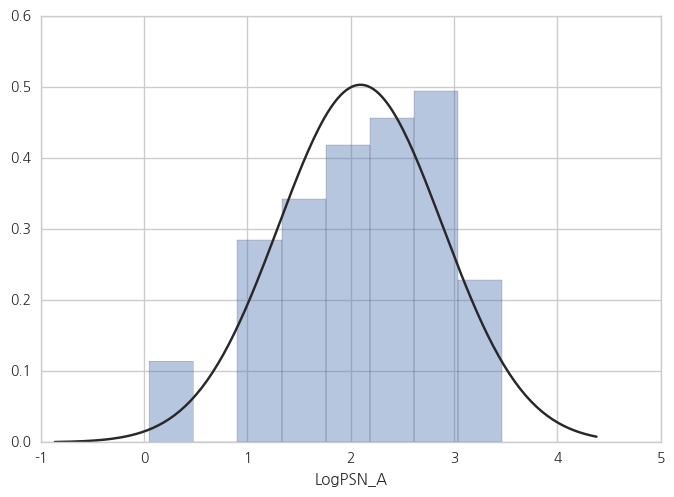

In [51]:
sns.distplot(df_hitter1["LogPSN_A"], kde=False, fit=sp.stats.norm)
plt.show()

# 4. Heatmap 

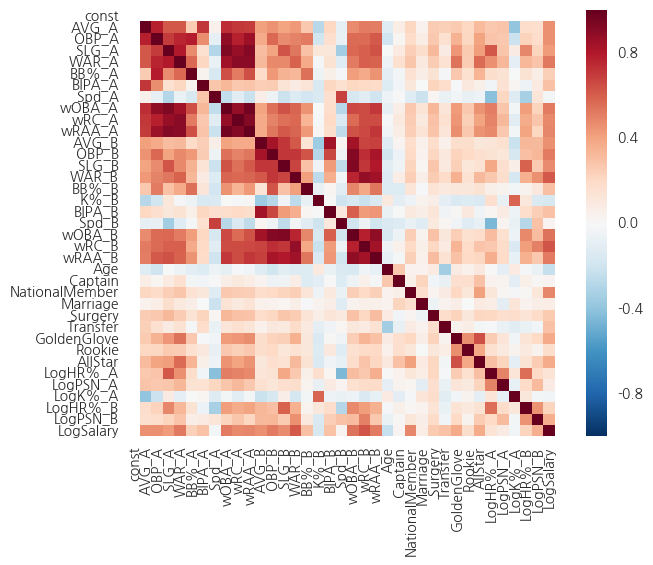

In [49]:
cormat = df_hitter1.corr()
sns.heatmap(cormat, square=True)
plt.show()

## SLG_A,  wOBA_A,  wOBA_B 제거 - 1차


In [50]:
del df_hitter1["SLG_A"]
del df_hitter1["wOBA_A"]
del df_hitter1["wOBA_B"]


In [51]:
model_sm1 = sm.OLS(df_hitter1.ix[:,-1], df_hitter1.ix[:,:-1])
result_sm1 = model_sm1.fit()
print(result_sm1.summary())

                            OLS Regression Results                            
Dep. Variable:              LogSalary   R-squared:                       0.722
Model:                            OLS   Adj. R-squared:                  0.623
Method:                 Least Squares   F-statistic:                     7.314
Date:                Thu, 02 Mar 2017   Prob (F-statistic):           4.25e-14
Time:                        15:19:11   Log-Likelihood:                -62.912
No. Observations:                 123   AIC:                             191.8
Df Residuals:                      90   BIC:                             284.6
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2051      2.660      0.

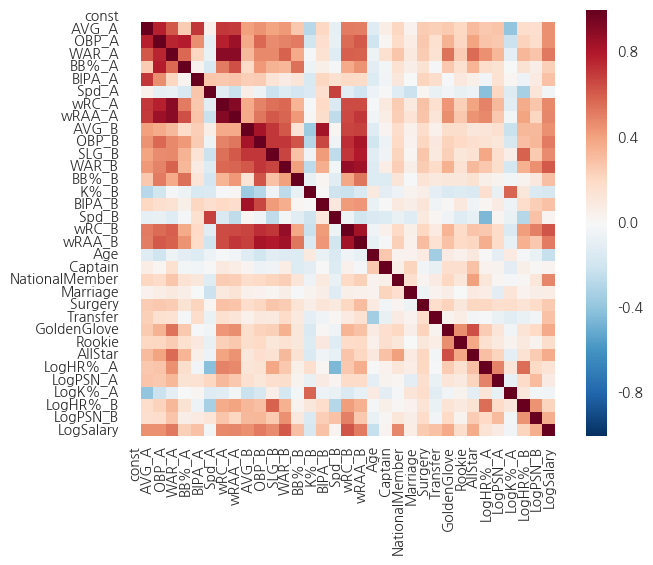

In [52]:
cormat = df_hitter1.corr()
sns.heatmap(cormat, square=True)
plt.show()

## wRC_A,wRC_B 제거 - 2차   

In [53]:
del df_hitter1["wRC_A"]
del df_hitter1["wRC_B"]
df_hitter2 = df_hitter1
model_sm2 = sm.OLS(df_hitter2.ix[:,-1], df_hitter2.ix[:,:-1])
result_sm2 = model_sm2.fit()
print(result_sm2.summary())

                            OLS Regression Results                            
Dep. Variable:              LogSalary   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     6.189
Date:                Thu, 02 Mar 2017   Prob (F-statistic):           6.20e-12
Time:                        15:19:19   Log-Likelihood:                -73.762
No. Observations:                 123   AIC:                             209.5
Df Residuals:                      92   BIC:                             296.7
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -1.8585      2.803     -0.

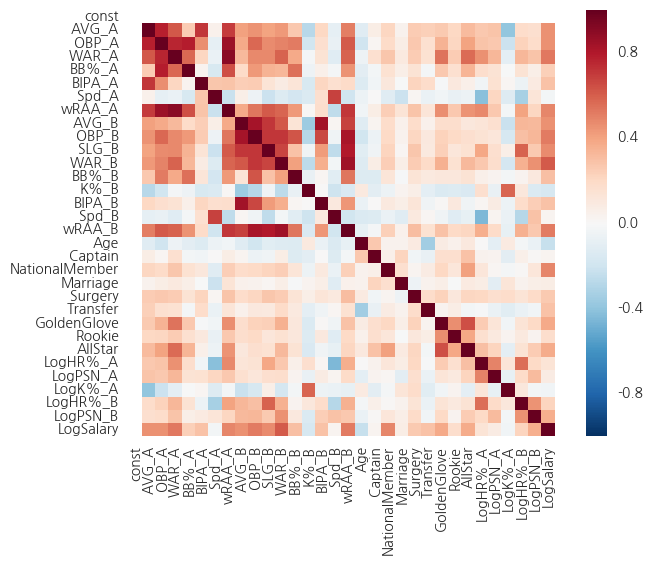

In [54]:
cormat = df_hitter2.corr()
sns.heatmap(cormat, square=True)
plt.show()

## wRAA_A , wRAA_B 제거 - 3차

In [55]:
del df_hitter2["wRAA_A"]
del df_hitter2["wRAA_B"]
model_sm2 = sm.OLS(df_hitter2.ix[:,-1], df_hitter2.ix[:,:-1])
result_sm2 = model_sm2.fit()
print(result_sm2.summary())

                            OLS Regression Results                            
Dep. Variable:              LogSalary   R-squared:                       0.664
Model:                            OLS   Adj. R-squared:                  0.564
Method:                 Least Squares   F-statistic:                     6.642
Date:                Thu, 02 Mar 2017   Prob (F-statistic):           1.54e-12
Time:                        15:19:37   Log-Likelihood:                -74.573
No. Observations:                 123   AIC:                             207.1
Df Residuals:                      94   BIC:                             288.7
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             -0.2292      2.134     -0.

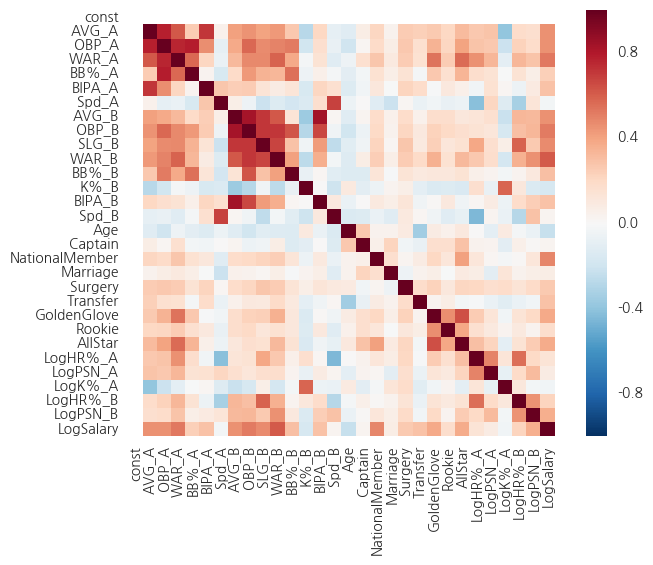

In [56]:
cormat = df_hitter2.corr()
sns.heatmap(cormat, square=True)
plt.show()

In [ ]:
sns.pairplot(df_hitter2)

 # 5. ETC 변수제거 

In [141]:
del df_hitter2["Captain"]
del df_hitter2["Transfer"]
del df_hitter2["Marriage"]
model_sm2 = sm.OLS(df_hitter2.ix[:,-1], df_hitter2.ix[:,:-1])
result_sm2 = model_sm2.fit()
print(result_sm2.summary())

                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.498
Method:                 Least Squares   F-statistic:                     5.848
Date:                Thu, 02 Mar 2017   Prob (F-statistic):           1.03e-10
Time:                        11:44:19   Log-Likelihood:                -316.09
No. Observations:                 123   AIC:                             684.2
Df Residuals:                      97   BIC:                             757.3
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             13.5809     14.393      0.

In [142]:
df_hitter3 = df_hitter2

 # 6.  P>|t| 50% 이상 제거 --------------------- 보류

In [143]:
del df_hitter3["Spd_A"]
del df_hitter3["BIPA_A"]
del df_hitter3["OBP_B"]
del df_hitter3["BB%_B"]
del df_hitter3["Surgery"]
del df_hitter3["GoldenGlove"]
del df_hitter3["LogHR%_A"]
del df_hitter3["NationalMember"]

model_sm3 = sm.OLS(df_hitter3.ix[:,-1], df_hitter3.ix[:,:-1])
result_sm3 = model_sm3.fit()
print(result_sm3.summary())





                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.475
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                     5.584
Date:                Thu, 02 Mar 2017   Prob (F-statistic):           9.27e-09
Time:                        11:45:14   Log-Likelihood:                -333.02
No. Observations:                 123   AIC:                             702.0
Df Residuals:                     105   BIC:                             752.6
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.6865     12.259     -0.301      0.7

In [92]:
model = sm.OLS.from_formula("salary ~AVG_A+	OBP_A+	WAR_A+	BB%_B+	SLG_B+	WAR_B+ 	Spd_B+	Age +	Marriage+	LogPSN_A+	LogHR%_B ", data=df_hitter1



SyntaxError: unexpected EOF while parsing (<ipython-input-92-ba97fc1c192a>, line 1)